# Data Science Hands-On

## Dozenten
### Dr. Gerrit Korff  
matti.gerrit.korff@exxeta.com  
+49 174 9951087  

### Oliver Weisse  
oliver.weisse@exxeta.com  
+49 17 37480098  

# Beschreibung der Aufgabe

Ein Immobilienunternehmen aus Kalifornien schätzt den Wert von Häusern. Eine große Hilfe für die Schätzung sind Listen mit den Median Preisen für ein Haus für jeden Bezirk. Für die meisten Bezirke ist der Median Hauspreis bekannt. Für einige andere Bezirke muss der Median Preis geschätzt werden. Wir wollen ein Modell aufbauen, um die Preise für unbekannte Bezirke zu schätzen.

In diesem Notebook wollen wir durch dieses beispielhafte Data Science Problem gehen. Wir fangen mit der Datensichtung an und schließen mit einem fertig trainierten Modell ab. Wie sie sehen werden, ist liegt ein großer Teil auf der Datenverarbeitung und nur ein kleiner Teil auf dem Modell-Training. Dies ist üblich für Data Science Projekte. Der Datensatz ist aus dem StatLib repository aus dem Jahre 1990.

Die Beispiele sind zum großen Teil aus dem Buch "Hands on Scikit-Learn and Tensorflow" entnommen.  
*Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition by Aurélien Géron Published by O'Reilly Media, Inc., 2019*  

# Agenda
* Datenexploration
* Datenprozessierung
* Modellierung
* Pipelines
* Modellserialisierung
* Modellservice

# Erster Blick auf die Daten

* Laden der Daten

In [1]:
import pandas as pd
%matplotlib inline
housing = pd.read_csv("housing.csv")

In [2]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


Wir haben verschiedene Informationen über die Bezirke, wie z.B. der genaue Ort (Geo-Daten), die Bevölkerung und das Median-Einkommen. Wir versuchen aus diesen Informationen vorherzusagen was die Variable median_house_value ist. Die Variable, die vorhegsagt werden soll, wird auch "Label" genannt. Was glauben Sie? Welche Informationen sind für die Vorhersage des Hauspreises besonders nützlich?

* Übersicht über den Datensatz

In [3]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


Unser Datensatz besteht aus 20640 Bezirken. Wir stellen außerdem fest, dass die Variable "total_bedrooms" einige fehlende (Null) Werte hat. Die Variablen sind alle numerisch, mit Ausnahme von "ocean_proximity", welche kategorisch ist. Wit schauen uns die Werte dieser kategorischen Variablen an:

* Kategorischer Datentyp

In [4]:
housing.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

Die Kategorien bschreiben in Textform, wie nah der Bezirk zum Meer ist. Wir schauen uns einige Statistiken der Daten an:

* Allgemeine Statistiken des Datensatzes

In [5]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


* Wertverteilung und Ausreißer

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc2d8533730>,
      dtype=object)

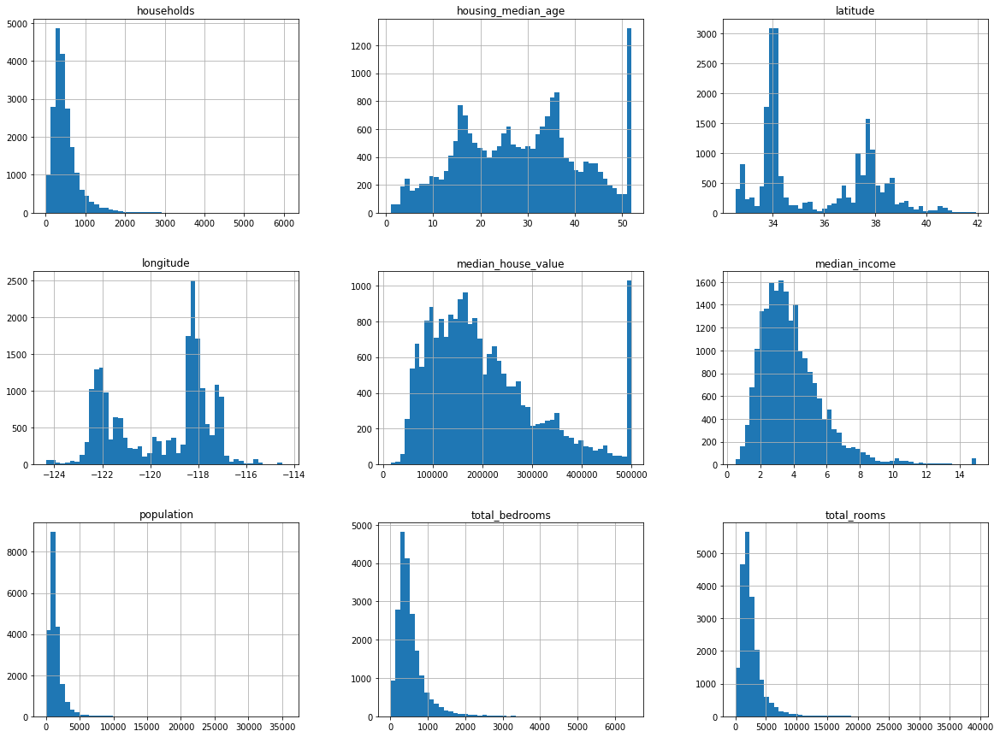

In [6]:
housing.hist(bins=50, figsize=(20,15))

In [7]:
housing.median_income.max()

15.0001

In [8]:
housing.median_income.min()

0.4999

Es fallen einige Sachen auf:

1. Das Median Einkommen (median income) scheint weder in US-Dollar, noch in Euro angegeben zu sein. Es scheint auf einer Skala von 5-15 zu sein. Vermutlich wurden auch hohe Gehälter (größer 15) auf 15 gerundet, da es dort einen Peak zu geben scheint. Es kann durchaus passieren, dass verarbeitete Daten übermittelt werden. Man sollte versuchen, wie die Daten verarbeitet wurden und ggf. Rücksprache halten. Die Skala spielt in Machine Learning Problemen für gewöhnlich keine Rolle.
2. Auch der Median Hauspreis und das Median Alter scheinen in einer ählichen Weise gerundet zu sein. Da wir den Median Hauspreis vorhersagen wollen ist unbedingt Rücksprache mit dem Auftraggeber nötig. Unser Modell könnte lernen, dass es keine Hauspreise größer als 500.000 US-Dollar gibt. Falls der Auftraggeber, dies so wünscht, können wir fortfahren. Sind präzise Vorhersagen jenseits der 500.000 Dollar Marke gewünscht, müssen Daten beschaffen werden, in denen diese Rundung nicht vorgenommen wird.

# Visualisieren der Daten

Um eine gute Intuition über die Daten zu erhalten, ist es sinnvoll einige Visualisierungen durchzuführen. Wir visualisieren den Ort der Bezirke. Wir erkennen Kalifornien und erkennen, dass die Datendichte in einigen Gebieten sehr viel höher ist als in anderen.

* Visualisierung durch Auftragung zweier Dimensionen gegeneinander

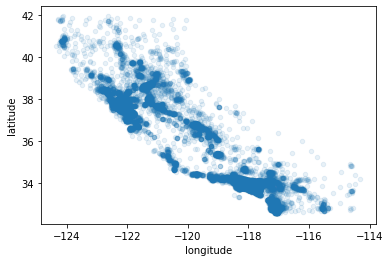

In [9]:
housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.1)

Lassen Sie uns noch den Preis und die Populationsgröße visualisieren:

* Ergänzung um weitere Dimensionen

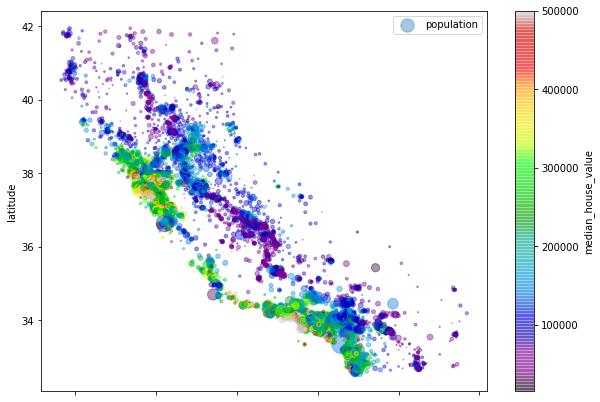

In [10]:
import matplotlib.pyplot as plt

housing.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
    s=housing["population"]/100, label="population", figsize=(10,7),
    c="median_house_value", cmap=plt.get_cmap("nipy_spectral"), colorbar=True,
)
plt.legend()

* Geodaten in realen Kontext setzen

In [11]:
import folium
import branca.colormap as cm

cmap = cm.linear.Spectral_10
colormap = cmap.to_step(index=[0, 100000, 200000, 300000, 400000, 500000])
colormap.colors = colormap.colors[::-1]

x_mean = housing['latitude'].mean() 
y_mean = housing['longitude'].mean()
max_median_house_value = housing["median_house_value"].max()
    
m = folium.Map(location=[x_mean, y_mean], zoom_start=6)


for i, house in housing.iterrows():
    if i == 100000:
        break
    x = house['latitude']
    y = house['longitude']
    folium.Circle(location=(x, y), radius=house["population"], stroke=True, weight=1,
                  tooltip=house["population"]/100,
                  fill_color=colormap(house["median_house_value"]),
                  fill=True, fill_opacity=.9,
                  color=None
                 ).add_to(m)


colormap.caption = 'Median House Prices'
colormap.add_to(m)
    
m

Es ist erkenntlich, dass der Hauspreis sehr von Ort und Populationsgröße abhängt.

# Korrelationen ausfindig machen

Lassen Sie uns schauen, welche Größen am stärksten mit dem Haus-Preis korrelieren. Die werden vermutlich die wichtigsten Informationen (auch "Features" genannt) sein. Bestätigen sich ihre Vermutungen?

* Korrelation der Merkmale mit der Zielgröße

In [12]:
corr_matrix = housing.corr()
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

Die stärkste positive Korrelation mit dem Hauspreis hat das Median Einkommen. Das heißt, wenn der das Median Einkommen in einem Bezirk hoch ist, ist auch ein hoher Hauspreis wahrscheinlich. Die stärkste negative Korrelation mit dem Hauspreis hat der Breitengrad. Wenn der Wert klein, der Bezirk also weit südlich ist, ist die Wahrscheinlichkeit eines hohen Preises wahrscheinlich.

Wir können die Korrelationen auch im "Scatter-Plot" erkennen. Ein Verlauf von links unten nach recht oben deutet eine positive Korrelation an. Ein Verlauf von links oben nach rechts unten eine negative Korrelation. Ist der Verlauf eher horizontal, deutet dies an, dass es keine Korrelation gibt. Die diagonalen Plots sind keine Scatter-Plots, denn ein Scatter-Plot einer Variable mit sich selbst ergibt immer eine perfekte Gerade (perfekte Korrelation). Stattdessen, sehen wir dort die Histogramme von oben. 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc2d8aa6370>,
      dtype=object)

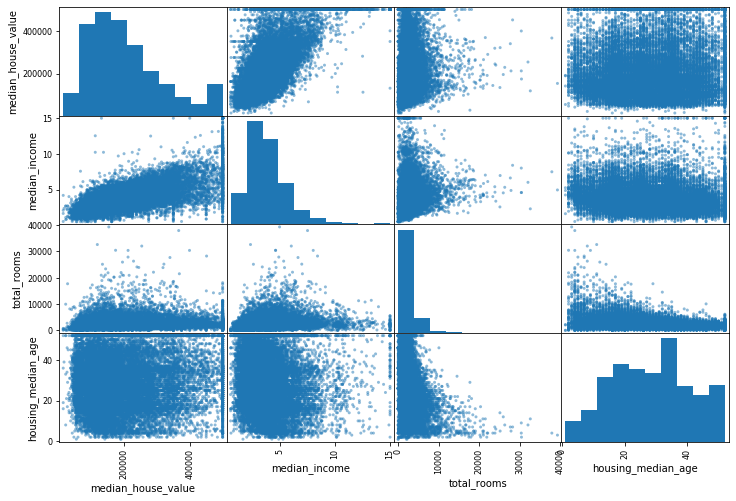

In [13]:
attributes = ["median_house_value", "median_income", "total_rooms",
              "housing_median_age"]
pd.plotting.scatter_matrix(housing[attributes], figsize=(12, 8))

Das vielversprechenste Attribut (englisch: Feature) ist das Median Einkommen. Wir schauen es uns genauer an:

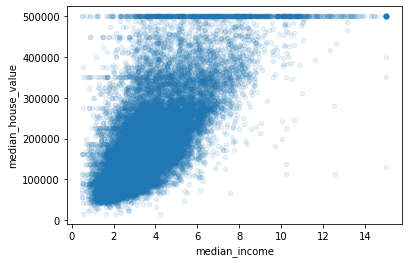

In [14]:
housing.plot(kind="scatter", x="median_income", y="median_house_value",
             alpha=0.1)

Wir erkennen klar und deutlich die Rundung hoher Haus-Werte auf 500.000 US-Dollar. Dies ist durch die horizontale ganz oben ersichtlich. Wir erkennen außerdem, dass ggf. weitere Rundungen statt gefunden haben. Es scheint als gäbe es eine weitere horizontale Linie bei 350.000 US-Dollar. Es könnte sein, dass diese Rundung nur für bestimmte Bezirke gemacht wurde und es kann ggf. sinnvoll sein, diese zu entfernen. In diesem Beispiel wollen wir aber darauf verzichten.

# Erstellen eines Test-Sets

In jedem Machine Learning Projekt ist es wichtig, ein Teil (meist 20-30%) der Daten als Testdaten zu nutzen. Diese Daten dürfen beim Trainieren des Modells nicht verwendet werden! Die Testdaten sind nur dazu da, am Ende die Performance ihres Modells zu beurteilen. Wenn ihr Modell die Testdaten schon beim Training sieht, könnte es z.B. die Labels auswendig lernen. Sieht das Modell neue Daten, kommt es dann zu sehr schlechten (oder gar keinen) Vorhersagen und das Modell generalisiert sehr schlecht. Dies ist in etwa so, als würden Sie für den Mathe-Test einfach die Antworten vom Test letzten Jahres auswendig lernen, ohne irgendwas zu verstehen. Kommt nächstes Jahr nur eine kleine Änderung, sind ihre auswendig gelernten Antworten nutzlos. Wenn die Antworten/Vorhersagen auf dem Trainingsset sehr viel besser sind als auf dem Testset spricht man vom "Overfitting". Dies ist das zentrale Thema von Machine Learning und es gibt etliche Methoden, um das "Overfitting" zu reduzieren. Wir wollen auf dem Testset genau so gut sein, wie auf dem Trainingsset. Die Methaper vereinfacht das Thema ein wenig, hilft aber eine Intuition für das Phänomen zu bekommen. Wir kommen später beim Modell-Training auf "Overfitting" zurück.

* Aufteilen der Daten in Training und Testset um eine unabhängige Kontrolle der Modellqualität zu erhalten

In [15]:
import numpy as np
from sklearn.model_selection import train_test_split

In [16]:
housing_raw_tr, housing_raw_test = train_test_split(housing, test_size=0.2, random_state=42)

# Erstellen neuer Features

Ein weiterer großer Teil im Machine Learning ist das "Feature Engineering". Wir versuchen unsere vorhandenen Featues so zu tranformieren oder fügen komplett neue Features ein, sodass die Modell-Performance nach oben geht. Wir versuchen dem Modell möglichst die Informationen zu liefern, welche für das Problem vermutlich am nützlichsten sind. Hier ist Domänenwissen wichtig, welches man durch Allgemeinwissen, Experteninterviews oder Recherche einbringen kann.

Vermutlich ist die auschlaggebendere Größe die Anzahl der Räume pro Haushalt als die einfache Summe der Räume in einem Viertel. Ähnlich verhält es sich mit den der Anzahl der Schlafzimmer pro Räume und der Population pro Haushalt.

* Berechnung neuer Features auf Basis von Domänenwissen

In [17]:
def create_new_features(df):
    df["rooms_per_household"] = df["total_rooms"]/df["households"]
    df["bedrooms_per_room"] = df["total_bedrooms"]/df["total_rooms"]
    df["population_per_household"]=df["population"]/df["households"]

In [18]:
create_new_features(housing_raw_tr)
create_new_features(housing_raw_test)

<ipython-input-17-287eb264d3c2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["rooms_per_household"] = df["total_rooms"]/df["households"]
<ipython-input-17-287eb264d3c2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["bedrooms_per_room"] = df["total_bedrooms"]/df["total_rooms"]
<ipython-input-17-287eb264d3c2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

Schauen wir uns wieder die Korrelationen an, sehen wir in der Tat, dass die neuen Features gut plaziert sind.

In [19]:
corr_matrix = housing_raw_tr.corr()
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value          1.000000
median_income               0.690647
rooms_per_household         0.158485
total_rooms                 0.133989
housing_median_age          0.103706
households                  0.063714
total_bedrooms              0.047980
population_per_household   -0.022030
population                 -0.026032
longitude                  -0.046349
latitude                   -0.142983
bedrooms_per_room          -0.257419
Name: median_house_value, dtype: float64

# Data Cleaning

Ein weiterer wichtiger Verarbeitungschritt ist das Data Cleaning. Oft gibt es in den Daten fehlende, falsch formartierte oder unvollständige Daten. Bevor wir einen ML-Algorithmus trainieren, müssen wir dies beheben.

Zunächst entfernen wir die Größe, welche vorhergesagt (das Label) werden soll von den Daten und speichern es einenem eigenen DataFrame.

In [20]:
housing_tr_labels = housing_raw_tr["median_house_value"].copy()
housing_tr = housing_raw_tr.drop("median_house_value", axis=1)

housing_test_labels = housing_raw_test["median_house_value"].copy()
housing_test = housing_raw_test.drop("median_house_value", axis=1)

In [21]:
housing_tr.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,rooms_per_household,bedrooms_per_room,population_per_household
14196,-117.03,32.71,33.0,3126.0,627.0,2300.0,623.0,3.2596,NEAR OCEAN,5.017657,0.200576,3.691814
8267,-118.16,33.77,49.0,3382.0,787.0,1314.0,756.0,3.8125,NEAR OCEAN,4.473545,0.232703,1.738095
17445,-120.48,34.66,4.0,1897.0,331.0,915.0,336.0,4.1563,NEAR OCEAN,5.645833,0.174486,2.723214
14265,-117.11,32.69,36.0,1421.0,367.0,1418.0,355.0,1.9425,NEAR OCEAN,4.002817,0.258269,3.994366
2271,-119.80,36.78,43.0,2382.0,431.0,874.0,380.0,3.5542,INLAND,6.268421,0.180940,2.300000


In [22]:
housing_tr_labels.head()

14196    103000.0
8267     382100.0
17445    172600.0
14265     93400.0
2271      96500.0
Name: median_house_value, dtype: float64

In unserem Fall gibt es fehlende Werte. Es gibt verschiedene Möglichkeiten die Daten zu bereinigen. In einigen Fällen macht es Sinn das gesamte Attribut zu entfernen oder das Sample zu entfernen. In anderen Fällen macht es Sinn den Mittelwert oder den Median einzusetzen. Wir wollen die fehlenden Werte mit einem typischen Wert ersetzen und nutzen dafür den Median.

* Ergänzen fehlender Daten über imputing

In [23]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")
housing_tr_num = housing_tr.drop("ocean_proximity", axis=1)
housing_test_num = housing_test.drop("ocean_proximity", axis=1)
imputer.fit(housing_tr_num)

SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='median', verbose=0)

In [24]:
imputer.statistics_

array([-1.18510000e+02,  3.42600000e+01,  2.90000000e+01,  2.12900000e+03,
        4.37000000e+02,  1.16700000e+03,  4.10000000e+02,  3.54580000e+00,
        5.23587365e+00,  2.02807652e-01,  2.81723971e+00])

In [25]:
X = imputer.transform(housing_tr_num)
housing_tr_num = pd.DataFrame(X, columns=housing_tr_num.columns,
                          index=housing_tr_num.index)

In [26]:
X = imputer.transform(housing_test_num)
housing_test_num = pd.DataFrame(X, columns=housing_test_num.columns,
                          index=housing_test_num.index)

# Kategorische Variablen

Machine Learning Algorithmen können standardmäßig nur numerische Daten verarbeiten. Wir müssen also die kategorischen Variablen entsprechend verarbeiten. Wir haben nur eine einzige kategorische Variable "Ocean Proximity", welche die Nähe zum Meer angibt.

In [27]:
housing_tr_cat = housing_tr[["ocean_proximity"]]
housing_test_cat = housing_test[["ocean_proximity"]]
housing_tr_cat.head(10)

,ocean_proximity
14196,NEAR OCEAN
8267,NEAR OCEAN
17445,NEAR OCEAN
14265,NEAR OCEAN
2271,INLAND
17848,<1H OCEAN
6252,<1H OCEAN
9389,NEAR BAY
6113,<1H OCEAN
6061,<1H OCEAN


Eine Möglichkeit dieses Feature in numerische Werte umzuwandeln ist das "Ordinal Encoding". Wir ersetzen jede Kategorie mit einer entsprechenden Zahl. Der Algorthmus wird nun aber die Kategorien so behandeln, dass Kategorie 1 und 2 näher beieinander sind als Kategorie 1 und 4. Dies macht nur in manchen Fällen Sinn. Z.B: für den Fall der Kategorien "dunkel":1, "hell":2 und "sehr hell":3. Wir nehmen an, dass "dunkel" näher and "hell" ist als an "sehr hell". Für unseren Fall macht ein Ordinales Encoding nur bedingt Sinn. Es ist nicht klar, ob "Near Bay" oder "Near Ocean" kleiner sein soll. Wenn wir die Kategorien nicht in eine Reihenfolge bringen können nutzen wir stattdessen das OneHotEncoding.

In [28]:
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
housing_tr_cat_encoded = ordinal_encoder.fit_transform(housing_tr_cat)
housing_tr_cat_encoded[:10]

array([[4.],
       [4.],
       [4.],
       [4.],
       [1.],
       [0.],
       [0.],
       [3.],
       [0.],
       [0.]])

Beim OneHotEncoding erstellen wir aus dem kategorischen Features mehrere binäre kategorische Features. Jedes Feature fragt eine Kategorie ab, z.B. "Inland" gleich "wahr" oder "Island" gleich "wahr". In der unten stehenden Tabelle sehen wir unseren neuen Daten

In [29]:
from sklearn.preprocessing import OneHotEncoder
cat_encoder = OneHotEncoder()
housing_tr_cat_1hot = cat_encoder.fit_transform(housing_tr_cat)
housing_tr_cat_1hot

<16512x5 sparse matrix of type '<class 'numpy.float64'>'
	with 16512 stored elements in Compressed Sparse Row format>

In [30]:
housing_tr_cat_1hot = pd.DataFrame(housing_tr_cat_1hot.toarray(),
                                   columns =cat_encoder.categories_ ,index = housing_tr.index)

In [31]:
housing_test_cat_1hot = cat_encoder.fit_transform(housing_test_cat)
housing_test_cat_1hot = pd.DataFrame(housing_test_cat_1hot.toarray(),
                                   columns =cat_encoder.categories_ ,index = housing_test.index)

In [32]:
housing_tr_cat_1hot.head()

,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
14196,0.0,0.0,0.0,0.0,1.0
8267,0.0,0.0,0.0,0.0,1.0
17445,0.0,0.0,0.0,0.0,1.0
14265,0.0,0.0,0.0,0.0,1.0
2271,0.0,1.0,0.0,0.0,0.0


# Feature Scaling

Ein weiterer Verarbeitungsschritt, welcher oft gebraucht wird ist das "Feature Scaling". In diesem Schritt wollen wir die Spanne der numerischen Variablen auf einen ähnlichen Bereich bringen. Wir skalieren die Features also so, dass sie alle den Mittelwert 0 und die Standardabweichung 1 haben. Dies ist bei vielen Algorithmen für die Stabilität des Trainings notwendig. Für andere Algorithmen ist es notwendig, dass sie überhaupt sinnvolle Ergebnisse produzieren. Die Algorithmen, welche wir benutzen werden (Lineare Regression und Entscheindungsbäume) brauchen nicht notwendigerweise Feature Scaling. Für die Lineare Regression ist aber die Abschätzung der "Feature Importance" (die Wichtigkeit der einzelnen Features für die Vorhersage) nur mit "Feature Scaling" möglich.

In [33]:
from sklearn.preprocessing import StandardScaler

In [34]:
housing_tr_num.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_household,bedrooms_per_room,population_per_household
14196,-117.03,32.71,33.0,3126.0,627.0,2300.0,623.0,3.2596,5.017657,0.200576,3.691814
8267,-118.16,33.77,49.0,3382.0,787.0,1314.0,756.0,3.8125,4.473545,0.232703,1.738095
17445,-120.48,34.66,4.0,1897.0,331.0,915.0,336.0,4.1563,5.645833,0.174486,2.723214
14265,-117.11,32.69,36.0,1421.0,367.0,1418.0,355.0,1.9425,4.002817,0.258269,3.994366
2271,-119.80,36.78,43.0,2382.0,431.0,874.0,380.0,3.5542,6.268421,0.180940,2.300000


In [35]:
scaler = StandardScaler()
housing_tr_num = pd.DataFrame(scaler.fit_transform(housing_tr_num), columns = housing_tr_num.columns, index = housing_tr_num.index)
housing_test_num = pd.DataFrame(scaler.transform(housing_test_num), columns = housing_test_num.columns, index = housing_test_num.index)
housing_tr_num.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_household,bedrooms_per_room,population_per_household
14196,1.272587,-1.372811,0.348490,0.222569,0.211228,0.768276,0.322906,-0.326196,-0.174916,-0.211785,0.051376
8267,0.709162,-0.876696,1.618118,0.340293,0.593094,-0.098901,0.672027,-0.035843,-0.402835,0.342185,-0.117362
17445,-0.447603,-0.460146,-1.952710,-0.342597,-0.495226,-0.449818,-0.430461,0.144701,0.088216,-0.661658,-0.032280
14265,1.232698,-1.382172,0.586545,-0.561490,-0.409306,-0.007434,-0.380587,-1.017864,-0.600015,0.783032,0.077507
2271,-0.108551,0.532084,1.142008,-0.119565,-0.256559,-0.485877,-0.314962,-0.171488,0.349007,-0.550364,-0.068832


In [36]:
housing_tr = housing_tr_num.join(housing_tr_cat_1hot)
housing_test = housing_test_num.join(housing_test_cat_1hot)

In [37]:
housing_tr.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,rooms_per_household,bedrooms_per_room,population_per_household,"(<1H OCEAN,)","(INLAND,)","(ISLAND,)","(NEAR BAY,)","(NEAR OCEAN,)"
14196,1.272587,-1.372811,0.348490,0.222569,0.211228,0.768276,0.322906,-0.326196,-0.174916,-0.211785,0.051376,0.0,0.0,0.0,0.0,1.0
8267,0.709162,-0.876696,1.618118,0.340293,0.593094,-0.098901,0.672027,-0.035843,-0.402835,0.342185,-0.117362,0.0,0.0,0.0,0.0,1.0
17445,-0.447603,-0.460146,-1.952710,-0.342597,-0.495226,-0.449818,-0.430461,0.144701,0.088216,-0.661658,-0.032280,0.0,0.0,0.0,0.0,1.0
14265,1.232698,-1.382172,0.586545,-0.561490,-0.409306,-0.007434,-0.380587,-1.017864,-0.600015,0.783032,0.077507,0.0,0.0,0.0,0.0,1.0
2271,-0.108551,0.532084,1.142008,-0.119565,-0.256559,-0.485877,-0.314962,-0.171488,0.349007,-0.550364,-0.068832,0.0,1.0,0.0,0.0,0.0


# Trainieren eines Modells: Lineare Regression

Nun kommen wir zum eigentlichen Modell-Training. In diesem Schritt wollen wir eine lineare Regression durchführen. Hierfür müssen wir zunächst eine Fehler-Metrik definieren, welche wir optimieren wollen. Die Fehler-Metrik soll der Performance der Vorhersage entsprechen. Die mit Abstand häufigst genutzte Fehlermetrik, welche verwendet wird die mittlere quadratische Abweichung unserer Vorhersagen von den wahren Labels Kurz wird diese Metrik auch mit MSE (von "mean squared error") bezeichnet. Wir bezeichnen unsere Vorhersagen mit $y_i$, unsere wahren Labels mit $t_i$ und die Anzahl der Samples mit $N$. Dann ist unsere Fehler Metrik $MSE = \frac{1}{N} \sum_i (y_i-t_i)^2$

Nun kommen wir zur lineare Regression. Die Idee ist es als Modell eine Hyperebene (in 1D eine Gerade, in 2D eine Ebene usw.) anzunehmen und die entsprechenden Parameter aus den Daten zu lernen. Schauen wir uns der Einfachheit halber den 1D Fall an. In diesem Fall haben wir eine gerade, welche wir möglichst genau an die Daten anpassen wollen. Dies tun wir indem wir den MSE minimieren. Der Algorithmus bestimmt automatisch die Steigung und den y-Achsen Abschnitt und verwendet dann das Modell für die Vorhersage.

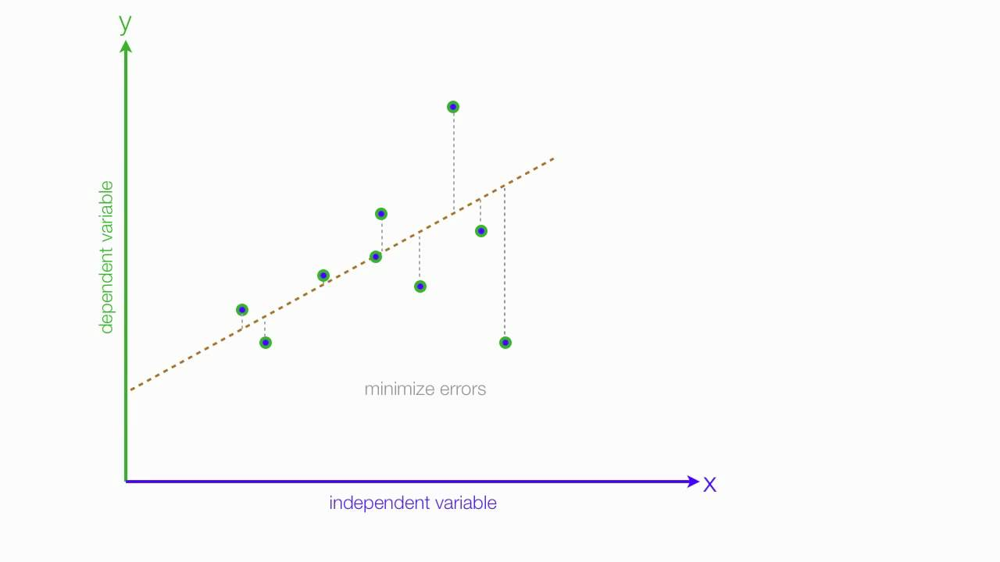

In [38]:
from IPython.display import Image
Image("lin_reg.jpg")

In [39]:
housing_tr_labels

14196    103000.0
8267     382100.0
17445    172600.0
14265     93400.0
2271      96500.0
           ...   
11284    229200.0
11964     97800.0
5390     222100.0
860      283500.0
15795    325000.0
Name: median_house_value, Length: 16512, dtype: float64

In [40]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(housing_tr, housing_tr_labels)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [41]:
train_predictions = lin_reg.predict(housing_tr)
train_predictions = pd.Series(train_predictions, index = housing_tr.index) 

Schauen wir uns unsere Vorhersagen an:

In [42]:
error_table = pd.DataFrame([housing_tr_labels,train_predictions],index = ["true","prediction"]).T
error_table["absolute_error"] = abs(error_table["true"]-error_table["prediction"])
error_table["squared_error"] = error_table["absolute_error"]**2
error_table.head()

,true,prediction,absolute_error,squared_error
14196,103000.0,181746.543596,78746.543596,6.201018e+09
8267,382100.0,290558.749735,91541.250265,8.379801e+09
17445,172600.0,244957.500178,72357.500178,5.235608e+09
14265,93400.0,146498.510614,53098.510614,2.819452e+09
2271,96500.0,163230.423939,66730.423939,4.452949e+09


Unsere Standardabweichung liegt bei ca. 70.000$. Dies ist nicht die mittlere Abweichung, sondern die Wurzel der quadratischen mittleren Abweichung. Aber es gibt trotzdem die Größenordnung unserer Vorhersagen von den wahren Abweichungen an. Hier ist auf jeden Fall noch Luft nach oben!

In [43]:
from sklearn.metrics import mean_squared_error
np.sqrt(mean_squared_error(housing_tr_labels, train_predictions))

67593.20745775253

In [44]:
test_predictions = pd.Series(lin_reg.predict(housing_test),index = housing_test.index)
np.sqrt(mean_squared_error(housing_test_labels, test_predictions))

69127.03829924983

Wir können uns auch anschauen, welche Features das Modell als am wichtigsten betrachtet. Wenn der Bezirk auf einer Insel liegt, ist der Preis besonders hoch. 

In [45]:
pd.Series(lin_reg.coef_, index = housing_tr.columns).sort_values(ascending=False)

(ISLAND,)                   112060.244452
median_income                78904.439397
households                   40233.724848
bedrooms_per_room            16809.104551
housing_median_age           14122.304752
rooms_per_household           7699.448488
total_rooms                   5881.104980
total_bedrooms                5307.662997
population_per_household       750.367943
(NEAR OCEAN,)               -15666.740391
(<1H OCEAN,)                -18666.478553
(NEAR BAY,)                 -24109.185132
population                  -46320.285471
(INLAND,)                   -53617.840376
longitude                   -56276.058852
latitude                    -56638.231159
dtype: float64

# Trainieren eines Modells: Entscheidungsbäume

Schauen wir uns einen weiteren Algoritmus an: Entscheidungsbäume. Diese sind intiuitiv einfach zu verstehen und aus diesem Grund sehr beliebt. Im Bild unten trainieren wir einen Entscheidungsbaum mit einem Level an. Wir schauen uns nur das Feature "median_income" an. Wenn dieser Wert (Feature ist skaliert!) unter 0.633 liegt ist unsere Vorhersage ca. 170.000 Dollar. Andernfalls ist unsere Vorhersage ca. 330.000 Dollar.

In [46]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt

[Text(248.0, 271.79999999999995, 'median_income <= 0.633\nmse = 13367782117.894\nsamples = 16512\nvalue = 207194.694'),
 Text(124.0, 90.60000000000002, 'mse = 8336427076.336\nsamples = 13101\nvalue = 173978.823'),
 Text(372.0, 90.60000000000002, 'mse = 12179125297.99\nsamples = 3411\nvalue = 334770.512')]

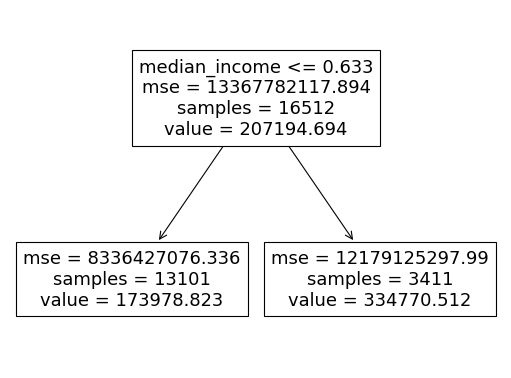

In [47]:
DT = DecisionTreeRegressor(max_depth=1)
DT.fit(housing_tr, housing_tr_labels)

plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plot_tree(DT,feature_names = housing_tr.columns)

Trainieren wir einen größeren Baum.

[Text(496.0, 604.0, 'median_income <= 0.633\nmse = 13367782117.894\nsamples = 16512\nvalue = 207194.694'),
 Text(248.0, 362.4, "('INLAND',) <= 0.5\nmse = 8336427076.336\nsamples = 13101\nvalue = 173978.823"),
 Text(124.0, 120.79999999999995, 'mse = 8151792197.422\nsamples = 8389\nvalue = 208417.459'),
 Text(372.0, 120.79999999999995, 'mse = 2794359370.513\nsamples = 4712\nvalue = 112666.065'),
 Text(744.0, 362.4, 'median_income <= 1.579\nmse = 12179125297.99\nsamples = 3411\nvalue = 334770.512'),
 Text(620.0, 120.79999999999995, 'mse = 9082773293.124\nsamples = 2384\nvalue = 295372.463'),
 Text(868.0, 120.79999999999995, 'mse = 7399452942.27\nsamples = 1027\nvalue = 426226.159')]

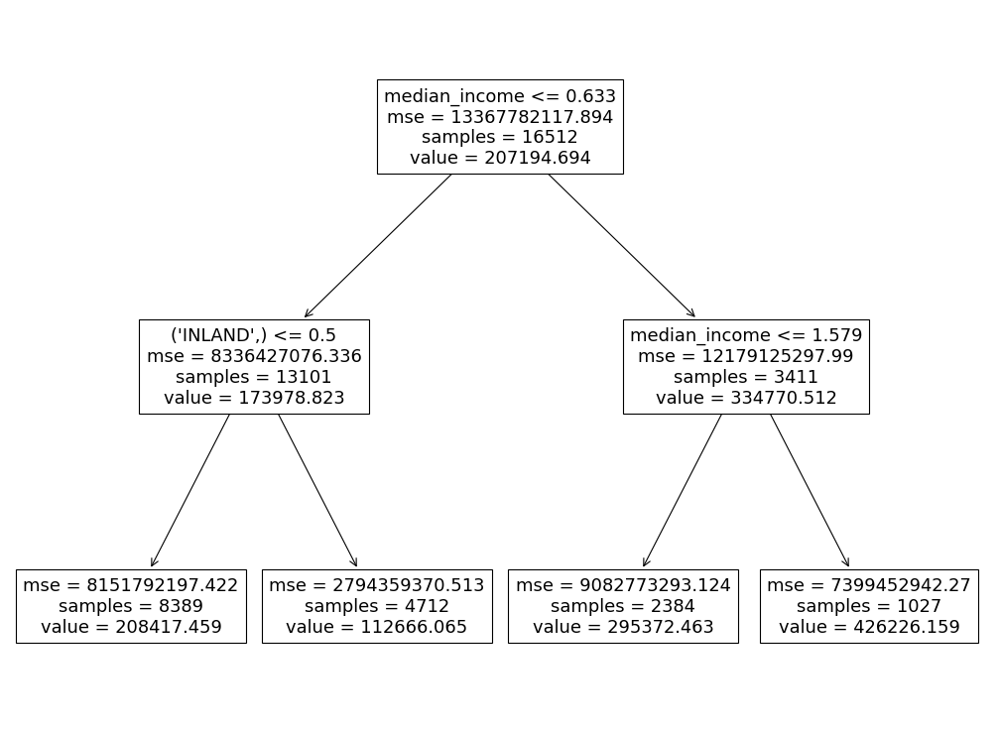

In [48]:
DT = DecisionTreeRegressor(max_depth=2)
DT.fit(housing_tr, housing_tr_labels)

plt.figure(num=None, figsize=(16, 12), dpi=80, facecolor='w', edgecolor='k')
plot_tree(DT,feature_names = housing_tr.columns)

Sind größere Bäume immer besser? Trainieren wir Bäume mit einem bis zu zwanzig Level und schauen uns unsere MSE auf dem Trainings und Test-Set an. Wir sehen, dass unser Fehler auf dem Trainingsset immer kleiner wird. Jedoch steigt der Fehler auf dem Test-Set nach anfänglichem Sinken wieder an! Das Ziel ist es auf dem Test-Set eine gute Performance zu haben. Nur diese Daten hat der Algoritmus noch nicht gesehen. Da unsere Performance für 20 Level auf dem Test-Set deutlich unter dem Trainingsset liegt, handelt es sich hierbei um "Overfitting". Die optimale Anzahl der Level scheint hier bei ca. 5 zu liegen.

In [49]:
train_error = []
test_error = [] 
for max_depth in range(1,20):
    DT = DecisionTreeRegressor(max_depth=max_depth)
    DT.fit(housing_tr, housing_tr_labels)
    train_predictions = pd.Series(DT.predict(housing_tr),index = housing_tr.index)
    test_predictions = pd.Series(DT.predict(housing_test),index = housing_test.index)
    train_error.append(np.sqrt(mean_squared_error(housing_tr_labels, train_predictions)))
    test_error.append(np.sqrt(mean_squared_error(housing_test_labels, test_predictions)))

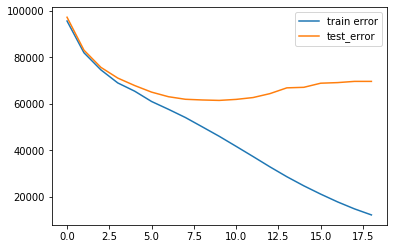

In [50]:
plt.plot(train_error)
plt.plot(test_error)
plt.legend(["train error","test_error"])
plt.show()

Unsere Performance ist nun schon besser, als für die lineare Regression. Probieren wir einen weiteren Algorithmus aus: "Random Forrest". Das Prinzip ist hier, mehrere Entscheidungsbäume zu trainieren und dann die Vorhersage der vielen Bäume zu mitteln. Natürlich müssen sich die Entscheidungsbäume hierbei unterscheiden (z.B. in der Anzahl der Level). Unsere Standarabweichung liegt nun nur noch bei ca. 50.000 Dollar.

In [51]:
DT = RandomForestRegressor()
DT.fit(housing_tr, housing_tr_labels)
test_predictions = pd.Series(DT.predict(housing_test),index = housing_test.index)
np.sqrt(mean_squared_error(housing_test_labels, test_predictions))

49453.08513416216

# Gridsearch

Als letzes wollen wir noch ein Verfahren besprechen Hyperparameter von Modellen zu bestimmen. Hyperparameter für unseren Random Forrest sind zum Beispie wie viele Bäume wir trainieren wollen und wie viele Level diese Bäume haben soll. Die "Gridsearch" probiert verschiedene Werte aus und wählt das Modell mit der besten Performance.

In [52]:
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators': [3, 10, 30], 'max_depth': [5,10,15,20,30,40,50]},
  ]


grid_search = GridSearchCV(DT, param_grid, cv=5,
                           scoring='neg_mean_squared_error',
                           return_train_score=True)

grid_search.fit(housing_tr, housing_tr_labels)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jo

In [53]:
grid_search.best_params_

{'max_depth': 20, 'n_estimators': 30}

In [54]:
DT = grid_search.best_estimator_

In [55]:
test_predictions = pd.Series(DT.predict(housing_test),index = housing_test.index)
np.sqrt(mean_squared_error(housing_test_labels, test_predictions))

50250.528500676744

# Pipeline

Wie oben gezeigt, werden die verschiedenen Datentypen unterschiedlich prozessiert.

In [56]:
# Data types
categorical_features = ["ocean_proximity"]
numeric_features = [
    "longitude",
    "latitude",
    "housing_median_age",
    "total_rooms",
    "total_bedrooms",
    "population",
    "households",
    "median_income",
]

Um die gesamte Datenprozessierung in einer Pipeline abzubilden müssen wir die Funktion mit welcher wir die Ratio Features erstellt haben etwas anpassen.

In [57]:
def create_ratio_features(df):
    df_ret = pd.DataFrame()
    df_ret["rooms_per_household"] = df["total_rooms"] / df["households"]
    df_ret["bedrooms_per_room"] = df["total_bedrooms"] / df["total_rooms"]
    df_ret["population_per_household"] = df["population"] / df["households"]
    return df_ret

Eine Pipeline setzt sich aus Transformern zusammen, die auf die Daten angewendet werden.

In [58]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import functions
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer


ratios = ColumnTransformer(
    transformers=[
        (
            "rooms_per_household",
            FunctionTransformer(functions.create_ratio_features, validate=False),
            ["total_rooms", "households", "total_bedrooms", "population"],
        )
    ],
    remainder="passthrough",
)


# We create the preprocessing pipelines for both numeric and categorical data.
numeric_transformer = Pipeline(
    steps=[
        ("ratios", ratios),
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
    ]
)

categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant", fill_value="missing")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

In [59]:
# Sepearte data and labels
housing_labels = housing["median_house_value"].copy()
housing_data = housing.drop("median_house_value", axis=1).copy()

# Make a train and test split
X_train, X_test, y_train, y_test = train_test_split(housing_data, housing_labels, test_size=0.2, random_state=42)

# Fit the regressor and the whole pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', RandomForestRegressor())])
pipeline.fit(X_train, y_train)

print("model score: %.3f" % pipeline.score(X_test, y_test))

model score: 0.816


# Das trainierte Model speichern

Um das erstellte Model nach schließen dieses Notebooks noch zu verwenden, muss es serialisiert werden, sprich gespeichert werden.

In [60]:
import joblib

joblib.dump(pipeline, "my_model.pkl")
# and later...
my_model_loaded = joblib.load("my_model.pkl")
print("model score: %.3f" % my_model_loaded.score(X_test, y_test))

model score: 0.816


Für ein Deplyoment auf AWS oder Azure würde es sich anbieten direkt AWS Sagemaker bzw. Azure Machine Learning zu verwenden oder das Model im ONNX oder PMML Format zu serialisieren.

# Das Model in Produktion

Nachdem ein Modell erzeugt wurde, soll es nun auch im laufendem Betrieb verwendet werden. Hierfür ist das Jupyter-Notebook untauglich. Eine verbreitete Variante ist, es dass Modell als Service über eine REST-API bereitzustellen. Vorhersagen können dann über einfach HTTP Anfragen realisiert werden. 

In [61]:
import requests
import json

In diesem Beispiel läuft der Service auf einem lokalen FLASK Server

In [65]:
# local url
url = 'http://127.0.0.1:5000/'

Über eine GET Anfrage überprüfen wir, ob der Service auch zu erreichen ist.

In [64]:
# Check ervice healtj
get_health = requests.get(url+"health/check")
print(get_health.json())

{'random': '980.5440738426151', 'status': 'running', 'timestamp': 'Fri, 29 May 2020 08:58:17 ', 'version': '0.0.1'}


Wir schicken zwei Einträge unserer Testdaten zu unserem Service. Hierfür müssen die Testdaten zunächst in das JSON-Format konvertiert werden.

In [77]:
# sample data
display(X_test.iloc[0:2])
data = {"data": X_test.iloc[0:2].to_json(orient='records')}
data_json = json.dumps(data)
print(data_json)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
20046,-119.01,36.06,25.0,1505.0,NaN,1392.0,359.0,1.6812,INLAND
3024,-119.46,35.14,30.0,2943.0,NaN,1565.0,584.0,2.5313,INLAND


{"data": "[{\"longitude\":-119.01,\"latitude\":36.06,\"housing_median_age\":25.0,\"total_rooms\":1505.0,\"total_bedrooms\":null,\"population\":1392.0,\"households\":359.0,\"median_income\":1.6812,\"ocean_proximity\":\"INLAND\"},{\"longitude\":-119.46,\"latitude\":35.14,\"housing_median_age\":30.0,\"total_rooms\":2943.0,\"total_bedrooms\":null,\"population\":1565.0,\"households\":584.0,\"median_income\":2.5313,\"ocean_proximity\":\"INLAND\"}]"}


In [75]:
send_request = requests.post(url, data_json)
print(send_request)

<Response [200]>


Wir haben eine erfolgreiche Anfrage und können dem Antwort Body das Ergebnis entnehmen.

In [76]:
print(send_request.json())

{'results': [53677.0, 66363.0]}
